In [ ]:
import torch
import tensorflow as tf
import numpy as np
import random

print("Torch:", torch.__version__)
print("TensorFlow:", tf.__version__)
print("NumPy:", np.__version__)

Torch: 2.5.1+cu124
TensorFlow: 2.18.0
NumPy: 1.26.4


In [ ]:
import torch
import numpy as np
import random

seed = 42  # Change if needed

# Set seeds for reproducibility
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # For multi-GPU
np.random.seed(seed)
random.seed(seed)

# Ensure deterministic behavior
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
import torch
print(torch.cuda.get_device_name(0))

Tesla T4


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Transfer Learning with the custom dataset**
https://keras.io/guides/transfer_learning/

**----------------------------**

**----------------------------**

**----------------------------**

# **--- ConvXt_Tiny Model (Transfer Learning) ---**

In [ ]:
import numpy as np
import keras
from keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import tensorflow as tf

**Modle Configurations**

In [ ]:
keras.applications.ConvNeXtTiny(
    include_top=True,
    include_preprocessing=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name="convnext_tiny",
)

114735104/114735104 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


<Functional name=convnext_tiny, built=True>

In [ ]:
base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


**Freezing all trainable params(plus all sub-layers with trainable params) of the model**

In [ ]:
base_model.trainable = False  # Freeze the traiable layers

In [ ]:
# Define input layer
inputs = keras.Input(shape=(150, 150, 3))

# Pass input through base model
x = base_model(inputs, training=False)

# Ensure output is correctly shaped
x = keras.layers.Reshape(base_model.output_shape[1:])(x)  # Explicit reshaping (optional)

# Convert feature maps to vector
x = keras.layers.GlobalAveragePooling2D()(x)

# Dense layer for 5-class classification
outputs = keras.layers.Dense(5, activation="softmax")(x)  # Softmax for multi-class classification

# Create the final model
model_1 = keras.Model(inputs, outputs)

**Training ConvXt-Tiny Model**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Function to preprocess images manually
def preprocess_image(image):
    image = tf.image.resize(image, (150, 150))  # Resize to 150x150
    image = image / 255.0  # Normalize pixel values
    return image

# Data augmentation & rescaling for training dataset
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
    rotation_range=20,  # Example augmentation
    width_shift_range=0.2,
    height_shift_range=0.2,
    #horizontal_flip=True,
    brightness_range=[0.9, 1.9]  # Vary brightness
)

# Rescaling for validation dataset (no augmentation)
val_datagen = ImageDataGenerator(rescale=1./255)

# Load training dataset with automatic resizing
train_dataset = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Image_Templates_Lays/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='sparse'
)

# Load validation dataset with automatic resizing
val_dataset = val_datagen.flow_from_directory(
    '/content/drive/MyDrive/Image_Templates_Lays/val',
    target_size=(150, 150),
    batch_size=32,
    class_mode='sparse'
)

model_1.compile(
    optimizer=keras.optimizers.Adam(amsgrad=True),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

Found 80 images belonging to 5 classes.
Found 20 images belonging to 5 classes.


In [ ]:
import matplotlib.pyplot as plt

# Function to plot training & validation curves
def plot_training_curves(history):
    # Extracting accuracy and loss from history
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)  # Number of epochs

    # Plot Accuracy Curve
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r*-', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training vs Validation Accuracy')
    plt.legend()

    # Plot Loss Curve
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r*-', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training vs Validation Loss')
    plt.legend()

    plt.show()

In [ ]:
print(val_dataset.class_indices)

{'0_French_Cheese': 0, '1_Masala': 1, '2_Yogurt_Herb': 2, '3_Classic': 3, '4_Wavy_BBQ': 4}


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 0.2271 - loss: 1.7989 - val_accuracy: 0.3000 - val_loss: 1.4992
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 330ms/step - accuracy: 0.4078 - loss: 1.4083 - val_accuracy: 0.4000 - val_loss: 1.3105
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 415ms/step - accuracy: 0.5448 - loss: 1.1306 - val_accuracy: 0.4500 - val_loss: 1.2042
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step - accuracy: 0.8792 - loss: 0.8109 - val_accuracy: 0.3500 - val_loss: 1.1329
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 419ms/step - accuracy: 0.7979 - loss: 0.7615 - val_accuracy: 0.5500 - val_loss: 1.0249
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 324ms/step - accuracy: 0.8339 - loss: 0.6769 - val_accuracy: 0.5500 - val_loss: 0.9046
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 490ms/step - accuracy: 0.8609 - loss: 0.5694 - val_accuracy: 0.7500 - val_loss: 0.8023
Epoch 8/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 308ms/step - accuracy: 0.8750 - loss: 0.4911 - val_accuracy: 0.7500 - val_loss: 0.7631
Epoch

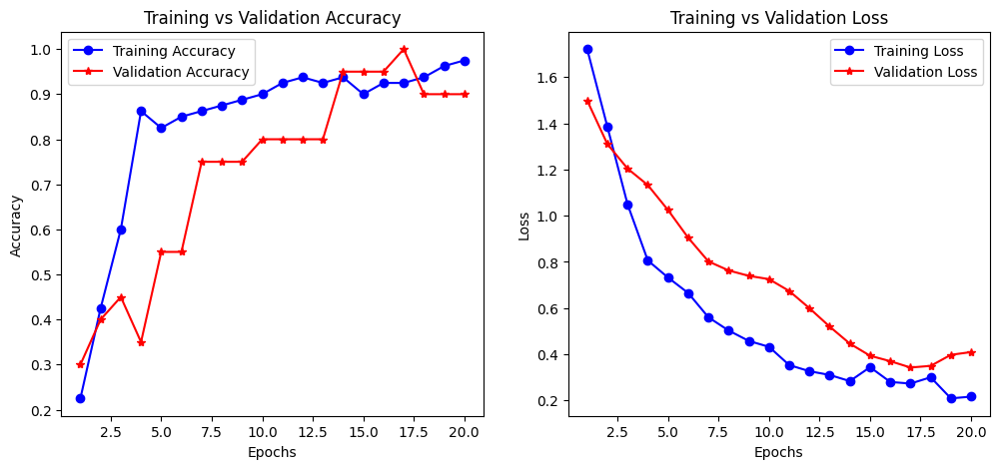

In [ ]:
history = model_1.fit(train_dataset, validation_data=val_dataset, epochs=20)
plot_training_curves(history)

**Test the trained ConvXt-tiny model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


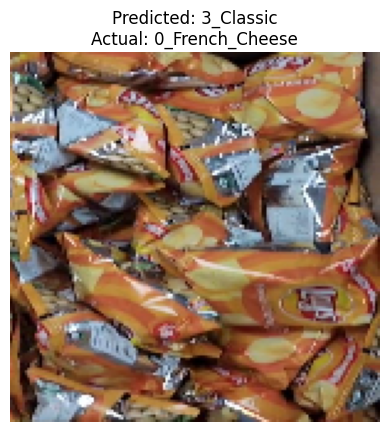

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


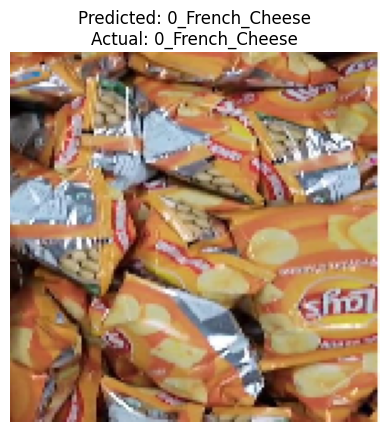

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


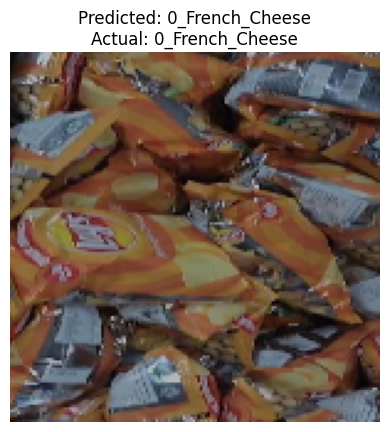

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


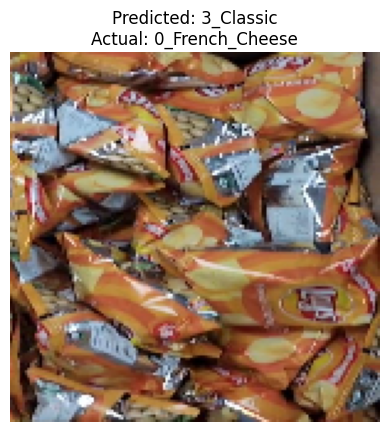

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


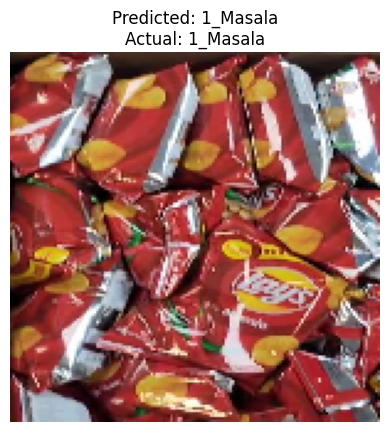

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


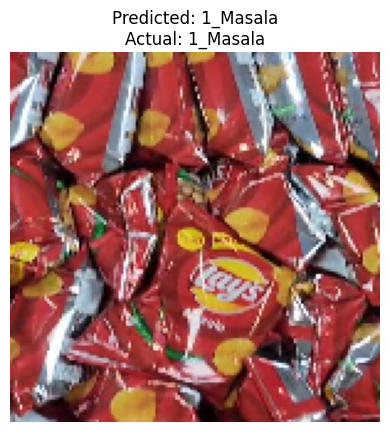

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


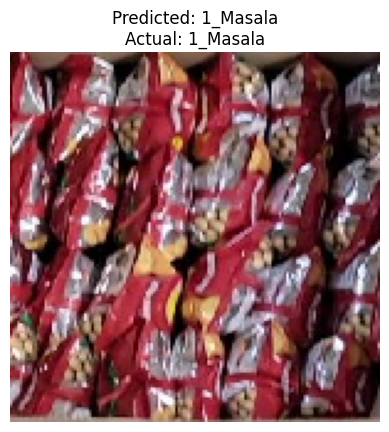

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


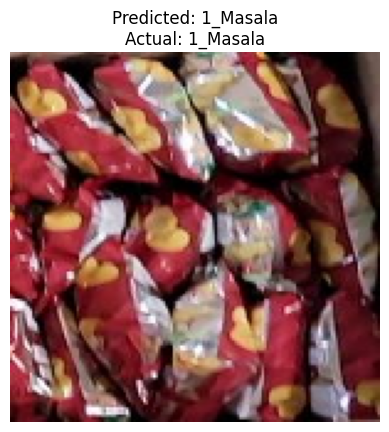

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


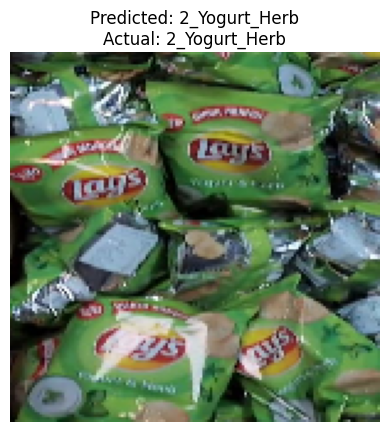

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


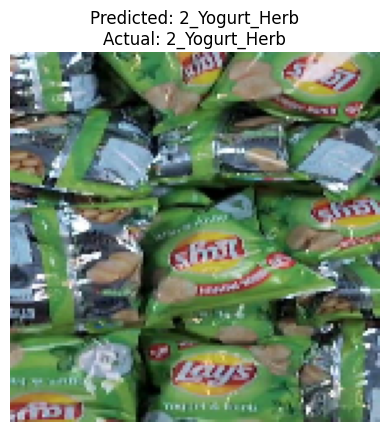

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


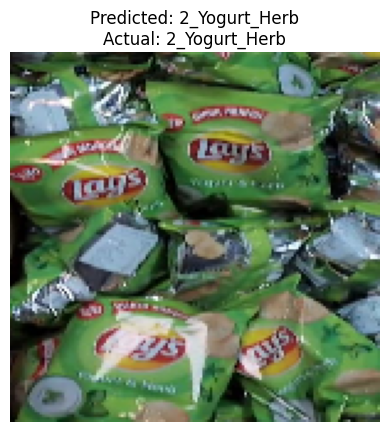

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


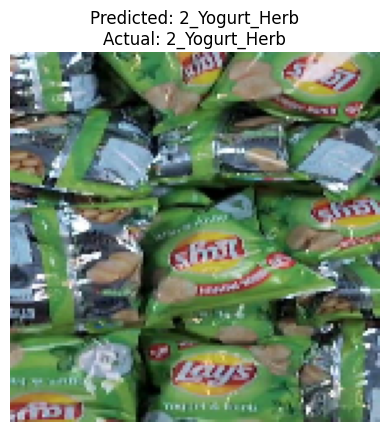

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


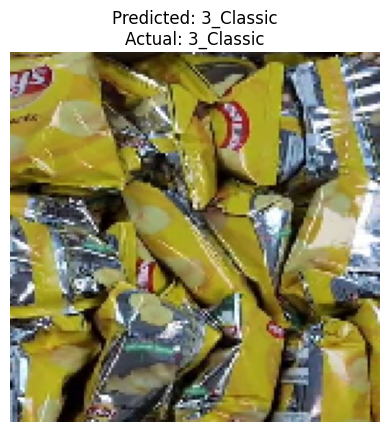

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


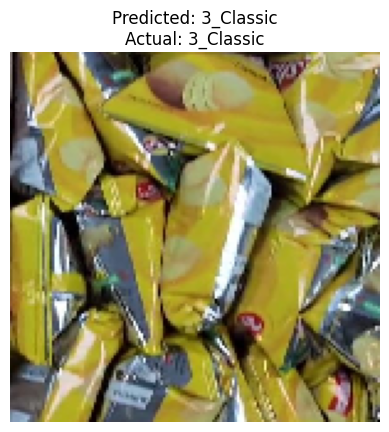

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


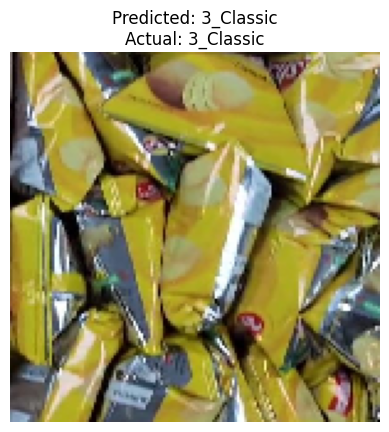

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


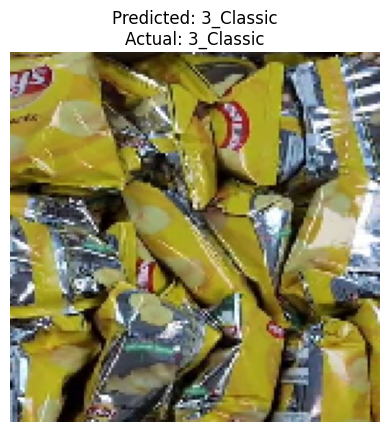

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


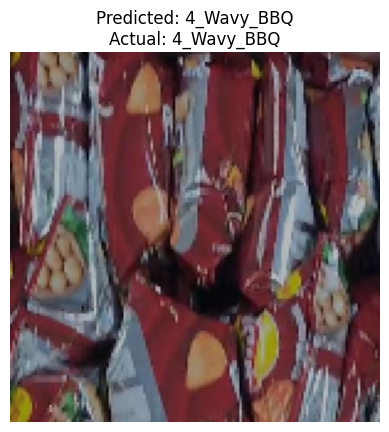

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


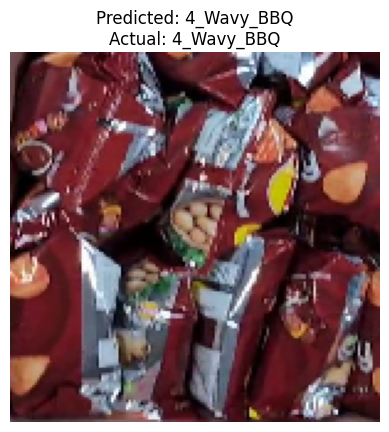

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


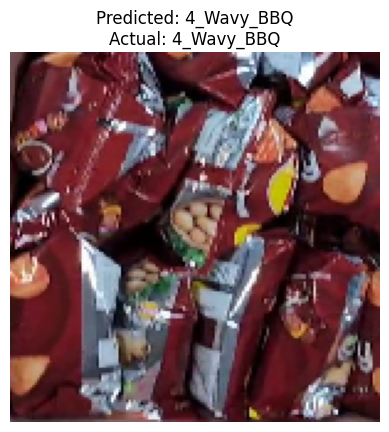

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


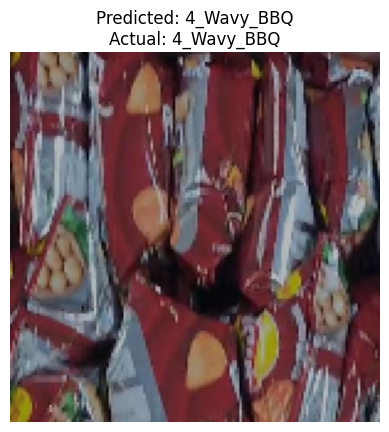

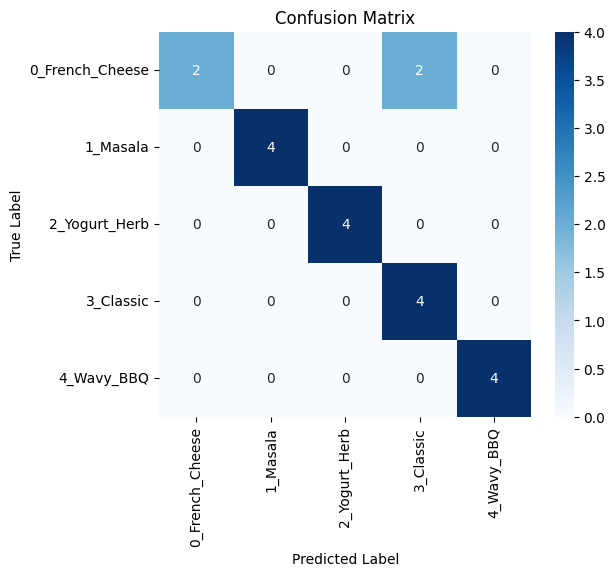


Classification Report:
                  precision    recall  f1-score   support

0_French_Cheese       1.00      0.50      0.67         4
       1_Masala       1.00      1.00      1.00         4
  2_Yogurt_Herb       1.00      1.00      1.00         4
      3_Classic       0.67      1.00      0.80         4
     4_Wavy_BBQ       1.00      1.00      1.00         4

       accuracy                           0.90        20
      macro avg       0.93      0.90      0.89        20
   weighted avg       0.93      0.90      0.89        20



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report

def load_and_preprocess_image(image_path, target_size=(150, 150)):
    """Loads and preprocesses an image."""
    try:
        img = image.load_img(image_path, target_size=target_size)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = img_array / 255.0  # Normalize
        return img, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None, None

def predict_images_from_folder(model, folder_path):
    """Predicts all images in a folder and computes confusion matrix."""
    true_labels = []
    pred_labels_model1 = []  # Renamed for model_1
    class_names = []

    # Identify class folders dynamically based on folder naming pattern
    all_folders = os.listdir(folder_path)
    class_folders = {}

    for folder in all_folders:
        folder_path_full = os.path.join(folder_path, folder)
        if os.path.isdir(folder_path_full):
            try:
                class_index = int(folder.split('_')[0])  # Extract numerical class index
                class_folders[class_index] = folder
            except ValueError:
                print(f"Skipping invalid folder name format: {folder}")
                continue

    # Sort class folders based on index
    sorted_class_folders = sorted(class_folders.items())
    class_names = [folder_name for _, folder_name in sorted_class_folders]

    for class_index, folder_name in sorted_class_folders:
        class_folder = os.path.join(folder_path, folder_name)

        for img_name in os.listdir(class_folder):
            img_path = os.path.join(class_folder, img_name)

            # Preprocess and predict
            img, img_array = load_and_preprocess_image(img_path)
            if img is None or img_array is None:
                continue  # Skip invalid images

            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions[0])  # Get predicted class

            # Store results
            true_labels.append(class_index)
            pred_labels_model1.append(predicted_class)  # Updated variable name

            # Display image with prediction
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Predicted: {class_names[predicted_class]}\nActual: {class_names[class_index]}")
            plt.show()

    # Ensure lists are not empty before computing confusion matrix
    if not true_labels or not pred_labels_model1:
        print("No images processed. Check folder structure and image paths.")
        return

    # Compute Confusion Matrix
    cm = confusion_matrix(true_labels, pred_labels_model1)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, cmap="Blues", fmt="d",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix - Model 1")
    plt.show()

    # Print Classification Report
    print("\nClassification Report - Model 1:\n", classification_report(true_labels, pred_labels_model1, target_names=class_names))

# Example usage
folder_path = "/content/drive/MyDrive/Image_Templates_Lays/val"  # Replace with your actual validation folder path
predict_images_from_folder(model_1, folder_path)

**----------------------------**


**----------------------------**

**----------------------------**

# **--- EfficientNetV2 B0 (Transfer learning)---**

In [ ]:
import numpy as np
import keras
from keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

**Configuration params**

In [ ]:
keras.applications.EfficientNetV2B0(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    include_preprocessing=True,
    name="efficientnetv2-b0",
)

29403144/29403144 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


<Functional name=efficientnetv2-b0, built=True>

In [ ]:
base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

**Freezing all trainable layers layers**

In [ ]:
base_model.trainable = False

In [ ]:
from tensorflow.keras.regularizers import l2

# Define input layer
inputs = keras.Input(shape=(150, 150, 3))

# Pass input through base model
x = base_model(inputs, training=False)

# Ensure output is correctly shaped
x = keras.layers.Reshape(base_model.output_shape[1:])(x)  # Explicit reshaping (optional)

# Convert feature maps to vector
x = keras.layers.GlobalAveragePooling2D()(x)

# Add dropout before the final Dense layer
x = keras.layers.Dropout(0.5)(x)  # 50% dropout

# Dense layer with L2 regularization
outputs = keras.layers.Dense(5, activation="softmax", kernel_regularizer=l2(0.0001))(x)  # L2 weight decay

# Create the final model
model_2 = keras.Model(inputs, outputs)

**Training EffNetV2-B0 model**

In [ ]:
lr_scheduler = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6
)

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True, verbose=1
)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to preprocess images manually
def preprocess_image(image):
    image = tf.image.resize(image, (150, 150))  # Resize to 150x150
    image = image / 255.0  # Normalize pixel values
    return image

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,  # Increase rotation
    #width_shift_range=0.3,
    #height_shift_range=0.3,
    #horizontal_flip=True,
    #zoom_range=0.3,  # Add zoom
    #shear_range=0.2,  # Add shear
    brightness_range=[0.9, 1.9]  # Vary brightness
)

# Rescaling for validation dataset (no augmentation)
val_datagen = ImageDataGenerator(rescale=1./255)

# Load training dataset with automatic resizing
train_dataset = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Image_Templates_Lays/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='sparse'
)

# Load validation dataset with automatic resizing
val_dataset = val_datagen.flow_from_directory(
    '/content/drive/MyDrive/Image_Templates_Lays/val',
    target_size=(150, 150),
    batch_size=32,
    class_mode='sparse'
)

model_2.compile(
    optimizer=keras.optimizers.Adam(amsgrad=True),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

Found 80 images belonging to 5 classes.
Found 20 images belonging to 5 classes.


In [ ]:
import matplotlib.pyplot as plt

# Function to plot training & validation curves
def plot_training_curves(history):
    # Extracting accuracy and loss from history
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)  # Number of epochs

    # Plot Accuracy Curve
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r*-', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training vs Validation Accuracy')
    plt.legend()

    # Plot Loss Curve
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r*-', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training vs Validation Loss')
    plt.legend()

    plt.show()

In [ ]:
print(train_dataset.class_indices)

{'0_French_Cheese': 0, '1_Masala': 1, '2_Yogurt_Herb': 2, '3_Classic': 3, '4_Wavy_BBQ': 4}


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.2344 - loss: 2.2449 - val_accuracy: 0.5500 - val_loss: 1.3671 - learning_rate: 0.0010
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.3383 - loss: 1.6217 - val_accuracy: 0.6500 - val_loss: 1.1518 - learning_rate: 0.0010
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 377ms/step - accuracy: 0.4406 - loss: 1.3107 - val_accuracy: 0.7000 - val_loss: 1.0014 - learning_rate: 0.0010
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 464ms/step - accuracy: 0.5750 - loss: 1.1087 - val_accuracy: 0.8000 - val_loss: 0.8996 - learning_rate: 0.0010
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 454ms/step - accuracy: 0.6714 - loss: 0.9400 - val_accuracy: 0.8000 - val_loss: 0.8192 - learning_rate: 0.0010
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 376ms/step - accuracy: 0.7844 - loss: 0.7239 - val_accuracy: 0.7000 - val_loss: 0.7550 - learning_rate: 0.0010
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 380ms/step - accuracy: 0.8573 - loss: 0.5055 - val_accuracy: 0.7000 - val_

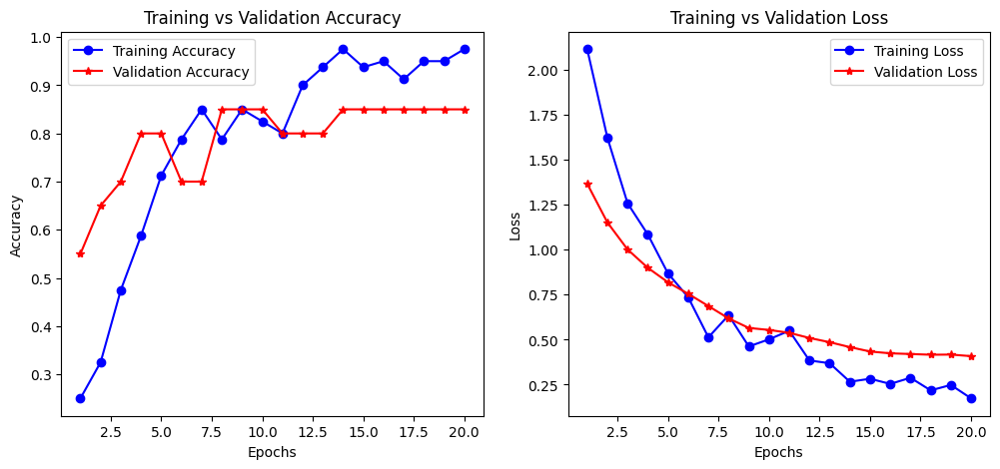

In [ ]:
history = model_2.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    callbacks=[early_stopping, lr_scheduler]  # Prevent overfitting
)
plot_training_curves(history)

**Testinng trained effnetV2-B0 model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


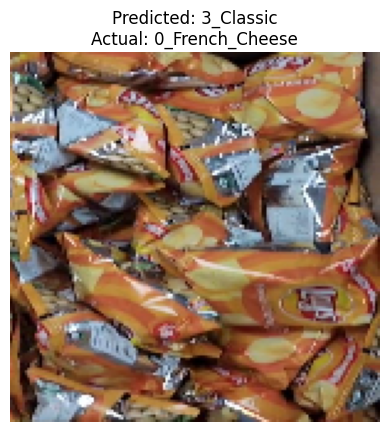

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


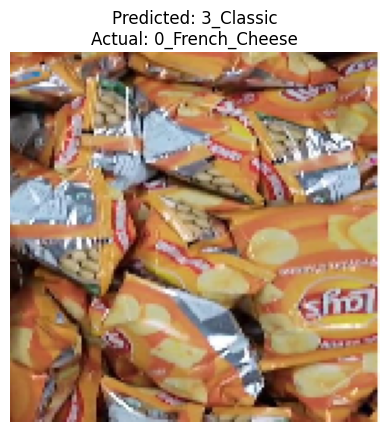

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


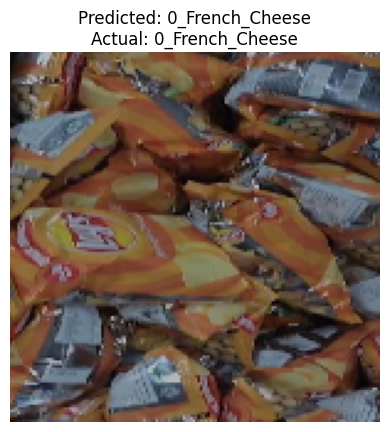

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


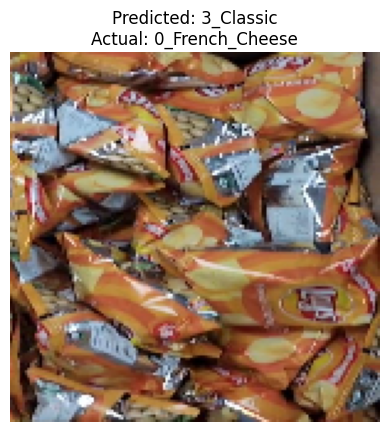

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


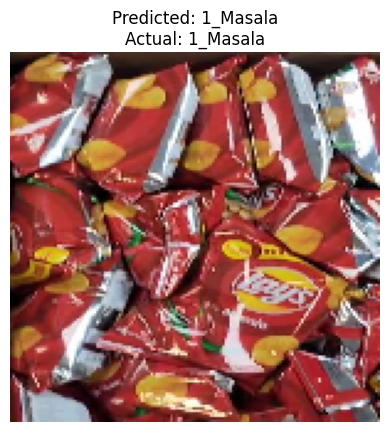

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


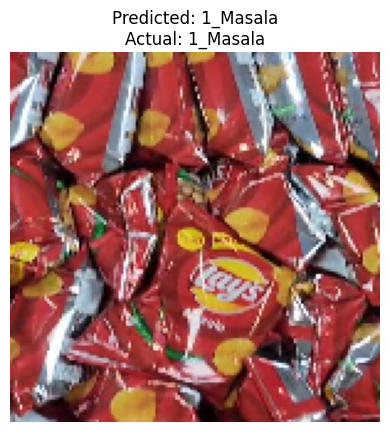

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


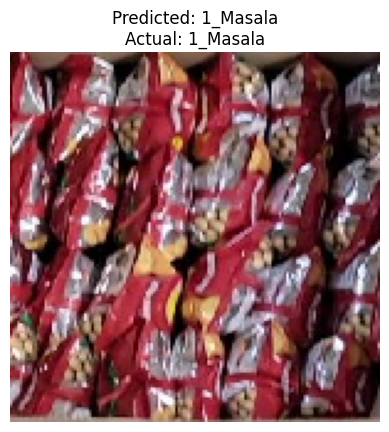

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


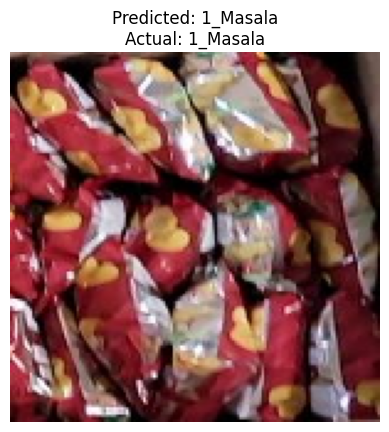

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


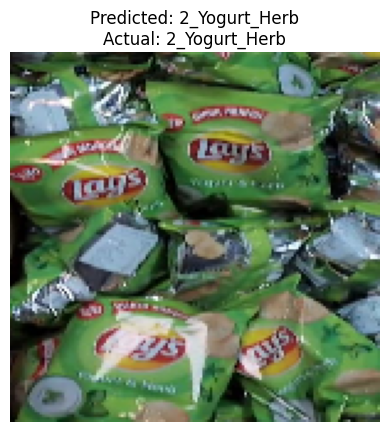

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


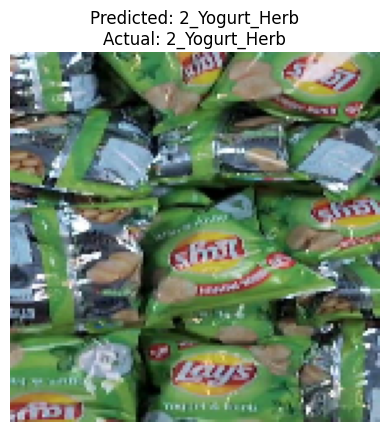

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


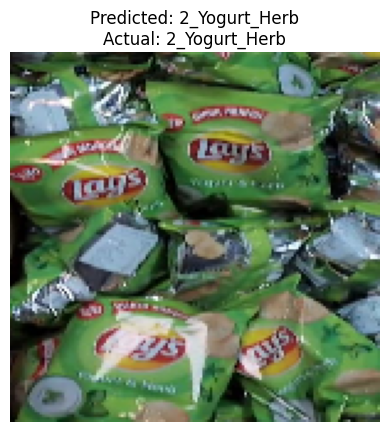

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


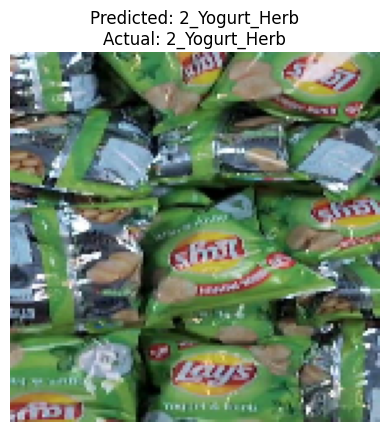

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


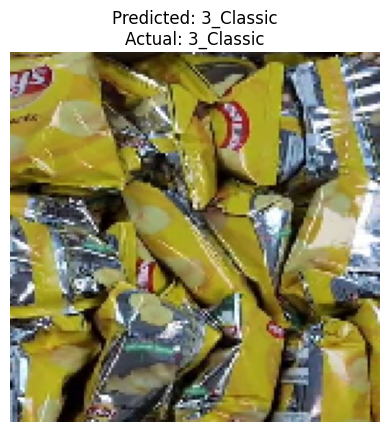

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


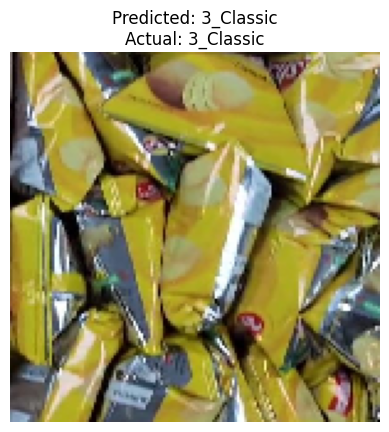

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


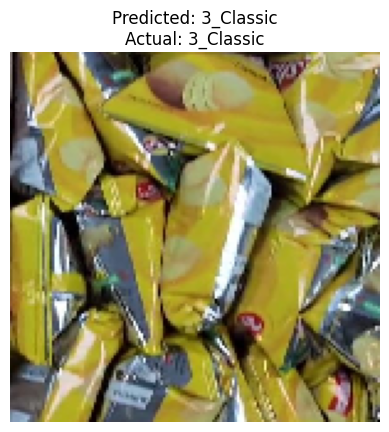

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


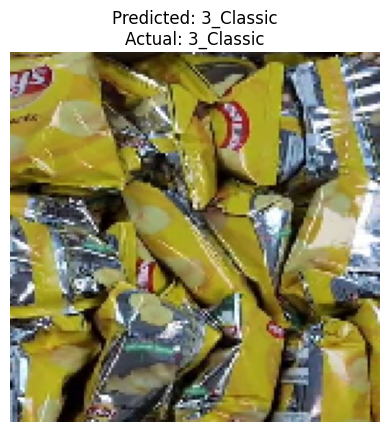

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


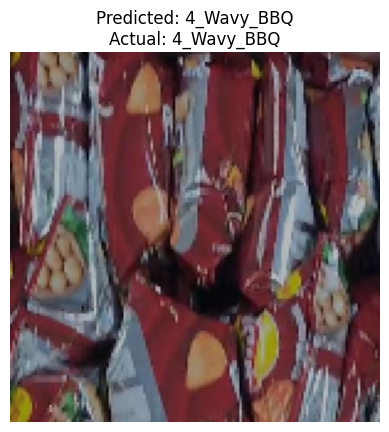

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


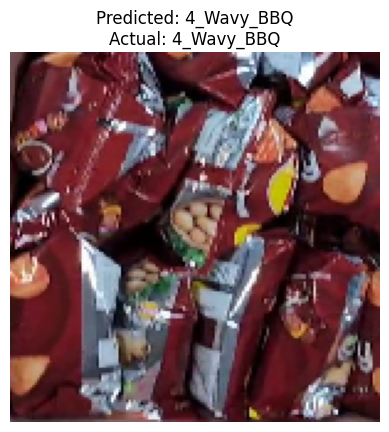

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


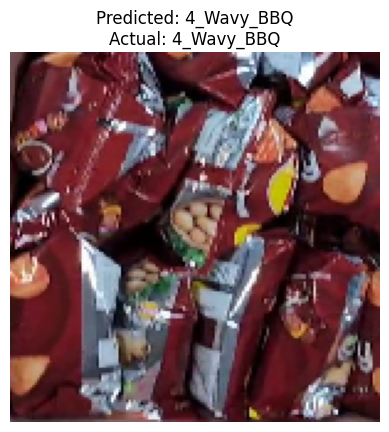

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


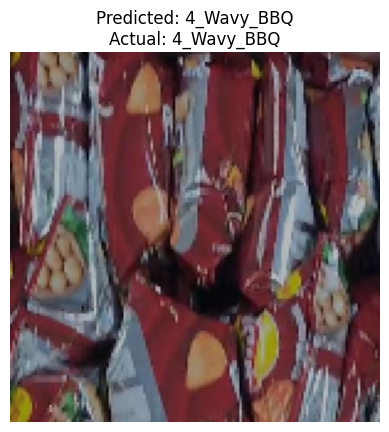

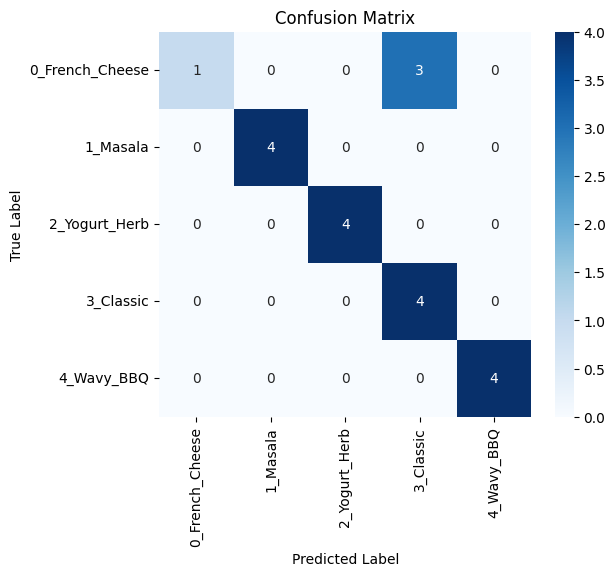


Classification Report:
                  precision    recall  f1-score   support

0_French_Cheese       1.00      0.25      0.40         4
       1_Masala       1.00      1.00      1.00         4
  2_Yogurt_Herb       1.00      1.00      1.00         4
      3_Classic       0.57      1.00      0.73         4
     4_Wavy_BBQ       1.00      1.00      1.00         4

       accuracy                           0.85        20
      macro avg       0.91      0.85      0.83        20
   weighted avg       0.91      0.85      0.83        20



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report

def load_and_preprocess_image(image_path, target_size=(150, 150)):
    """Loads and preprocesses an image."""
    try:
        img = image.load_img(image_path, target_size=target_size)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = img_array / 255.0  # Normalize
        return img, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None, None

def predict_images_from_folder(model, folder_path):
    """Predicts all images in a folder and computes confusion matrix."""
    true_labels = []
    pred_labels_model2 = []  # Updated variable name
    class_names = []

    # Identify class folders dynamically based on folder naming pattern
    all_folders = os.listdir(folder_path)
    class_folders = {}

    for folder in all_folders:
        folder_path_full = os.path.join(folder_path, folder)
        if os.path.isdir(folder_path_full):
            try:
                class_index = int(folder.split('_')[0])  # Extract numerical class index
                class_folders[class_index] = folder
            except ValueError:
                print(f"Skipping invalid folder name format: {folder}")
                continue

    # Sort class folders based on index
    sorted_class_folders = sorted(class_folders.items())
    class_names = [folder_name for _, folder_name in sorted_class_folders]

    for class_index, folder_name in sorted_class_folders:
        class_folder = os.path.join(folder_path, folder_name)

        for img_name in os.listdir(class_folder):
            img_path = os.path.join(class_folder, img_name)

            # Preprocess and predict
            img, img_array = load_and_preprocess_image(img_path)
            if img is None or img_array is None:
                continue  # Skip invalid images

            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions[0])  # Get predicted class

            # Store results
            true_labels.append(class_index)
            pred_labels_model2.append(predicted_class)

            # Display image with prediction
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Predicted: {class_names[predicted_class]}\nActual: {class_names[class_index]}")
            plt.show()

    # Ensure lists are not empty before computing confusion matrix
    if not true_labels or not pred_labels_model2:
        print("No images processed. Check folder structure and image paths.")
        return

    # Compute Confusion Matrix
    cm = confusion_matrix(true_labels, pred_labels_model2)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, cmap="Blues", fmt="d",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

    # Print Classification Report
    print("\nClassification Report:\n", classification_report(true_labels, pred_labels_model2, target_names=class_names))

# Example usage
folder_path = "/content/drive/MyDrive/Image_Templates_Lays/val"  # Replace with your actual validation folder path
predict_images_from_folder(model_2, folder_path)

# **Embeddings based KNN classification**

**----------------------------**

**----------------------------**

**----------------------------**

# **siglip2-base-patch32-256 + KNN**

In [ ]:
import torch
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from transformers import AutoModel, AutoImageProcessor
from transformers.image_utils import load_image
import os
from sklearn.model_selection import GridSearchCV

# Load model and image processor
ckpt = "google/siglip2-base-patch32-256"
model = AutoModel.from_pretrained(ckpt, device_map="auto").eval()
processor = AutoImageProcessor.from_pretrained(ckpt)

# Define dataset directory and classes
dataset_dir = "/content/drive/MyDrive/Image_Templates_Lays/train/"
classes = ["0_French_Cheese", "1_Masala", "2_Yogurt_Herb", "3_Classic", "4_Wavy_BBQ"]  # Update with actual class names

# Ensure dataset directory exists
if not os.path.exists(dataset_dir):
    raise ValueError(f"Dataset directory not found: {dataset_dir}")

X_train = []  # To store color feature embeddings
y_train = []  # To store corresponding labels

# Allowed image formats
valid_extensions = {".jpg", ".jpeg", ".png"}

# Loop through each class and extract embeddings
for label, class_name in enumerate(classes):
    class_path = os.path.join(dataset_dir, class_name)
    if not os.path.exists(class_path):
        print(f"Warning: Class folder not found: {class_path}")
        continue

    for root, _, files in os.walk(class_path):
        for img_name in files:
            img_path = os.path.join(root, img_name)

            if not any(img_name.lower().endswith(ext) for ext in valid_extensions):
                continue

            try:
                image = load_image(img_path)
                inputs = processor(images=image, return_tensors="pt").to(model.device)

                with torch.no_grad():
                    embedding = model.get_image_features(**inputs)  # Extract full image embedding

                if embedding is None or embedding.numel() == 0:
                    print(f"Warning: No embedding extracted for {img_path}")
                    continue

                # Extract only color feature embeddings
                color_features = embedding[:, 250:760]  # Select the first 50 dimensions (assuming color-related features)

                X_train.append(color_features.cpu().numpy().flatten())
                y_train.append(label)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

# Ensure there is data before proceeding
if len(X_train) == 0:
    raise ValueError("No valid image embeddings were extracted. Check your dataset path and images.")

# Convert lists to numpy arrays
X_train = np.array(X_train)
y_train = np.array(y_train)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)

# Find optimal k using cross-validation
best_k = None
best_score = 0
for k in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=5)
    mean_score = scores.mean()
    print(f"k={k}, Accuracy={mean_score:.4f}")

    if mean_score > best_score:
        best_score = mean_score
        best_k = k

# Train KNN model with best k
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train, y_train)
print(f"KNN model training complete with best k={best_k}!")

k=1, Accuracy=0.9375
k=2, Accuracy=0.9375
k=3, Accuracy=0.9375
k=4, Accuracy=0.9500
k=5, Accuracy=0.9250
k=6, Accuracy=0.9250
k=7, Accuracy=0.9125
k=8, Accuracy=0.9500
k=9, Accuracy=0.9500
k=10, Accuracy=0.9375
KNN model training complete with best k=4!


**Testing the above trained KNN model**

Test Images Shape: (20, 510), Expected Feature Size: 510

Model Accuracy: 90.00%


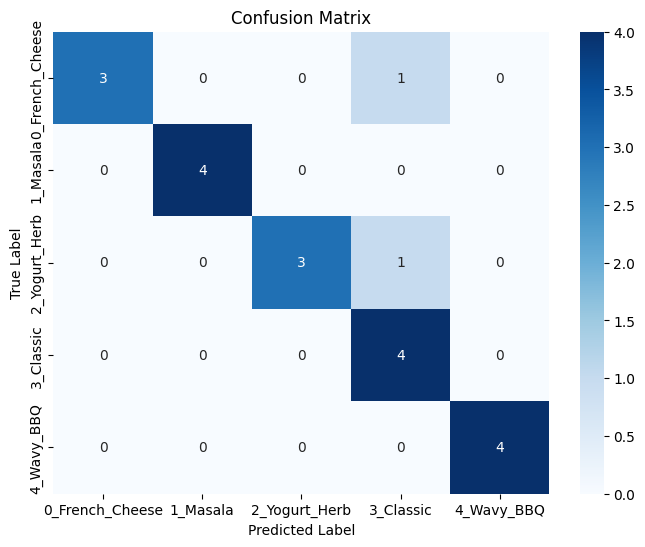

Test Image 1: Predicted - 0_French_Cheese, Actual - 0_French_Cheese
Test Image 2: Predicted - 3_Classic, Actual - 0_French_Cheese
Test Image 3: Predicted - 0_French_Cheese, Actual - 0_French_Cheese
Test Image 4: Predicted - 0_French_Cheese, Actual - 0_French_Cheese
Test Image 5: Predicted - 1_Masala, Actual - 1_Masala
Test Image 6: Predicted - 1_Masala, Actual - 1_Masala
Test Image 7: Predicted - 1_Masala, Actual - 1_Masala
Test Image 8: Predicted - 1_Masala, Actual - 1_Masala
Test Image 9: Predicted - 3_Classic, Actual - 2_Yogurt_Herb
Test Image 10: Predicted - 2_Yogurt_Herb, Actual - 2_Yogurt_Herb
Test Image 11: Predicted - 2_Yogurt_Herb, Actual - 2_Yogurt_Herb
Test Image 12: Predicted - 2_Yogurt_Herb, Actual - 2_Yogurt_Herb
Test Image 13: Predicted - 3_Classic, Actual - 3_Classic
Test Image 14: Predicted - 3_Classic, Actual - 3_Classic
Test Image 15: Predicted - 3_Classic, Actual - 3_Classic
Test Image 16: Predicted - 3_Classic, Actual - 3_Classic
Test Image 17: Predicted - 4_Wavy_B

In [ ]:
import os
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import AutoModel, AutoImageProcessor
from transformers.image_utils import load_image
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix

# Load model and image processor
ckpt = "google/siglip2-base-patch32-256"
model = AutoModel.from_pretrained(ckpt, device_map="auto").eval()
processor = AutoImageProcessor.from_pretrained(ckpt)

# Define test dataset directory
test_dataset_dir = "/content/drive/MyDrive/Image_Templates_Lays/val"

# Ensure test dataset directory exists
if not os.path.exists(test_dataset_dir):
    raise ValueError(f"Test dataset directory not found: {test_dataset_dir}")

# Allowed image formats
valid_extensions = {".jpg", ".jpeg", ".png"}

# Store test images and their actual labels
test_images = []
test_labels = []
class_labels = {}  # Mapping class names to integer labels

# Assign unique integer labels to class names
test_classes = sorted(os.listdir(test_dataset_dir))  # Sorted for consistency
for idx, class_name in enumerate(test_classes):
    class_labels[class_name] = idx

def extract_embeddings(image_path):
    """Extracts feature embeddings using SigLIP2 model (from 250 to 760 dimensions)."""
    image = load_image(image_path)
    inputs = processor(images=image, return_tensors="pt").to(model.device)

    with torch.no_grad():
        embedding = model.get_image_features(**inputs)

    if embedding is None or embedding.numel() == 0:
        return None

    return embedding[:, 250:760].cpu().numpy().flatten()  # Extract features from 250 to 760

# Loop through each class folder in the test dataset
for class_name in test_classes:
    class_path = os.path.join(test_dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue  # Skip if not a directory

    for root, _, files in os.walk(class_path):
        for img_name in files:
            img_path = os.path.join(root, img_name)

            if not any(img_name.lower().endswith(ext) for ext in valid_extensions):
                continue

            try:
                features = extract_embeddings(img_path)

                if features is None or len(features) != (760 - 250):  # 510 dimensions
                    print(f"Warning: No valid features extracted for {img_path}")
                    continue

                test_images.append(features)
                test_labels.append(class_labels[class_name])  # Store numeric label

            except Exception as e:
                print(f"Error processing {img_path}: {e}")

if len(test_images) == 0:
    raise ValueError("No valid test image features were extracted. Check your test dataset path and images.")

# Convert list to numpy array
test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Normalize test images using the same scaler as training
test_images = scaler.transform(test_images)

# Ensure feature consistency
print(f"Test Images Shape: {test_images.shape}, Expected Feature Size: {X_train.shape[1]}")

# Predict classes
predicted_classes = knn.predict(test_images)

# Calculate accuracy
accuracy = accuracy_score(test_labels, predicted_classes)
print(f"\nModel Accuracy: {accuracy * 100:.2f}%")

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_classes)

# Visualize confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=test_classes, yticklabels=test_classes)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Print detailed results
for i, pred in enumerate(predicted_classes):
    actual_class = list(class_labels.keys())[list(class_labels.values()).index(test_labels[i])]
    predicted_class = list(class_labels.keys())[list(class_labels.values()).index(pred)]
    print(f"Test Image {i+1}: Predicted - {predicted_class}, Actual - {actual_class}")

**----------------------------**

**----------------------------**

**----------------------------**

# **Ensembling all 3 models predicted results**

In [ ]:
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from sklearn.neighbors import KNeighborsClassifier
import torch
from transformers.image_utils import load_image

# Load the saved deep learning models
model_1 = load_model("/content/drive/MyDrive/Image_Templates_Lays/my_model_1.keras")
model_2 = load_model("/content/drive/MyDrive/Image_Templates_Lays/my_model_2.keras")

# Test dataset directory
test_dataset_dir = "/content/drive/MyDrive/Image_Templates_Lays/val"

# Ensure the directory exists
if not os.path.exists(test_dataset_dir):
    raise ValueError(f"Test dataset directory not found: {test_dataset_dir}")

# Allowed image formats
valid_extensions = {".jpg", ".jpeg", ".png"}

# Store test images and labels
test_images = []
test_labels = []
class_labels = {}  # Mapping class names to integer labels

# Assign unique integer labels to class names
test_classes = sorted(os.listdir(test_dataset_dir))  # Sorted for consistency
for idx, class_name in enumerate(test_classes):
    class_labels[class_name] = idx

def load_and_preprocess_image(image_path, target_size=(150, 150)):
    """Loads and preprocesses an image for deep learning models."""
    try:
        img = image.load_img(image_path, target_size=target_size)  # Resize to (150, 150)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = img_array / 255.0  # Normalize
        return img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def extract_embeddings(image_path):
    """Extracts feature embeddings for KNN (250 to 760 dimensions)."""
    try:
        img = load_image(image_path)
        inputs = processor(images=img, return_tensors="pt").to(model.device)
        with torch.no_grad():
            embedding = model.get_image_features(**inputs)
        return embedding[:, 250:760].cpu().numpy().flatten()  # Extract relevant dimensions
    except Exception as e:
        print(f"Error extracting embeddings for {image_path}: {e}")
        return None

# Process each image
test_images_model = []  # For model_1 & model_2
test_images_knn = []  # For KNN
test_labels = []  # True labels

for class_name in test_classes:
    class_path = os.path.join(test_dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue  # Skip if not a directory

    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)
        if not any(img_name.lower().endswith(ext) for ext in valid_extensions):
            continue

        try:
            # Process image for model_1 and model_2
            img_array = load_and_preprocess_image(img_path)
            if img_array is None:
                continue

            # Extract embeddings for KNN
            knn_features = extract_embeddings(img_path)
            if knn_features is None or len(knn_features) != (760 - 250):  # 510 dimensions
                continue

            # Store data
            test_images_model.append(img_array)
            test_images_knn.append(knn_features)
            test_labels.append(class_labels[class_name])  # Store numeric label

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Convert lists to numpy arrays
test_images_model = np.vstack(test_images_model)  # Shape: (num_samples, 150, 150, 3)
test_images_knn = np.array(test_images_knn)  # Shape: (num_samples, 510)
test_labels = np.array(test_labels)

# Get predictions from model_1 and model_2
pred_labels_model1 = model_1.predict(test_images_model).argmax(axis=1)
pred_labels_model2 = model_2.predict(test_images_model).argmax(axis=1)

# Retrain or reload KNN model
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

# Get predictions from KNN using the correct embedding range
predicted_classes = knn.predict(test_images_knn)

# Perform majority voting
final_predictions = []
for i in range(len(test_labels)):
    votes = [pred_labels_model1[i], pred_labels_model2[i], predicted_classes[i]]
    most_common_class = Counter(votes).most_common(1)[0][0]  # Get the most frequent class
    final_predictions.append(most_common_class)

# Convert to numpy array
final_predictions = np.array(final_predictions)

# Calculate Accuracy
ensemble_accuracy = accuracy_score(test_labels, final_predictions)
print(f"\nEnsemble Model Accuracy: {ensemble_accuracy * 100:.2f}%")

# Compute Confusion Matrix
conf_matrix = confusion_matrix(test_labels, final_predictions)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=test_classes, yticklabels=test_classes)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Voting Ensemble")
plt.show()

# Print Classification Report
print("\nClassification Report:\n", classification_report(test_labels, final_predictions, target_names=test_classes))

**----------------------------**

**----------------------------**

**----------------------------**

# **Classifying imges on basis of the histigram of Hue of all hue values**

In [ ]:
import cv2
import numpy as np
import os
from scipy.spatial import distance

def preprocess_image(image_path):
    """
    Reads an image, resizes it to 350x350, and increases brightness.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return None

    # Resize to 350x350
    image = cv2.resize(image, (350, 350))

    # Convert to HSV for brightness adjustment
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Increase brightness (V channel)
    image_hsv[:, :, 2] = cv2.add(image_hsv[:, :, 2], 50)  # Increase brightness by 50 (clip at 255)

    return image_hsv  # Return HSV image directly

def extract_hue_values(image_path):
    """
    Extracts all Hue values from an image and returns a histogram-based color distribution.
    """
    image_hsv = preprocess_image(image_path)
    if image_hsv is None:
        return None

    # Compute histogram for Hue channel (0-180)
    hist_h = cv2.calcHist([image_hsv], [0], None, [180], [0, 180])

    # Normalize histogram to get color distribution
    hist_h = hist_h / hist_h.sum()

    return hist_h.flatten()  # Flatten to store per-image distribution

# Step 1: Compute Hue distributions for images in each class
class_hue_distributions = {}  # Store color distributions for each class
train_data_path = "/content/drive/MyDrive/Image_Templates_Lays/train"  # Training dataset path

for class_folder in os.listdir(train_data_path):
    class_path = os.path.join(train_data_path, class_folder)
    if os.path.isdir(class_path):
        class_hues = []
        for image_file in os.listdir(class_path):
            image_path = os.path.join(class_path, image_file)
            hue_distribution = extract_hue_values(image_path)
            if hue_distribution is not None:
                class_hues.append(hue_distribution)

        if class_hues:
            class_hue_distributions[class_folder] = np.array(class_hues)  # Store all color data for each class
        else:
            print(f"Warning: No valid images found in {class_folder}")

# Step 2: Classify a new image based on Hue distribution similarity
def predict_class(test_image_path):
    test_hue_distribution = extract_hue_values(test_image_path)
    if test_hue_distribution is None:
        return "Error: Invalid test image"

    min_distance = float("inf")
    predicted_class = None

    for class_folder, hue_distributions in class_hue_distributions.items():
        # Compute average histogram difference across all images in the class
        avg_distance = np.mean([distance.euclidean(test_hue_distribution, h) for h in hue_distributions])
        if avg_distance < min_distance:
            min_distance = avg_distance
            predicted_class = class_folder

    return predicted_class

# Step 3: Evaluate model on test images
test_data_path = "/content/drive/MyDrive/Image_Templates_Lays/val"  # Test dataset path

correct_predictions = 0
total_images = 0

for class_folder in os.listdir(test_data_path):  # Loop through test subfolders (actual classes)
    class_path = os.path.join(test_data_path, class_folder)
    if os.path.isdir(class_path):
        for image_file in os.listdir(class_path):
            image_path = os.path.join(class_path, image_file)
            predicted_label = predict_class(image_path)

            total_images += 1
            if predicted_label == class_folder:
                correct_predictions += 1
            else:
                print(f"❌ Mismatch: Actual={class_folder}, Predicted={predicted_label}")

# Step 4: Compute and display accuracy
accuracy = (correct_predictions / total_images) * 100 if total_images > 0 else 0
print("\n✅ Classification Results:")
print(f"Total Test Images: {total_images}")
print(f"Correct Predictions: {correct_predictions}")
print(f"Accuracy: {accuracy:.2f}%")


✅ Classification Results:
Total Test Images: 20
Correct Predictions: 20
Accuracy: 100.00%


In [ ]:
import cv2
import numpy as np
import os
from scipy.spatial import distance

def preprocess_image(image_path):
    """
    Reads an image, resizes it to 350x350, and increases brightness.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return None

    # Resize to 350x350
    image = cv2.resize(image, (350, 350))

    # Convert to HSV for brightness adjustment
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Increase brightness (V channel)
    image_hsv[:, :, 2] = cv2.add(image_hsv[:, :, 2], 50)  # Increase brightness by 50 (clip at 255)

    return image_hsv  # Return HSV image directly

def extract_hue_values(image_path):
    """
    Extracts peak Hue values from an image and returns them as a feature vector.
    """
    image_hsv = preprocess_image(image_path)
    if image_hsv is None:
        return None

    # Compute histogram for Hue channel (0-180)
    hist_h = cv2.calcHist([image_hsv], [0], None, [180], [0, 180])

    # Normalize histogram
    hist_h = hist_h / hist_h.sum()

    # Extract peak Hue values (local maxima)
    peak_indices = np.where(hist_h == np.max(hist_h))[0]  # Indices of peak values

    return peak_indices  # Return only the peak Hue values

# Step 1: Compute Hue peak distributions for images in each class
class_hue_distributions = {}  # Store color peak distributions for each class
train_data_path = "/content/drive/MyDrive/Image_Templates_Lays/train"  # Training dataset path

for class_folder in os.listdir(train_data_path):
    class_path = os.path.join(train_data_path, class_folder)
    if os.path.isdir(class_path):
        class_hues = []
        for image_file in os.listdir(class_path):
            image_path = os.path.join(class_path, image_file)
            hue_distribution = extract_hue_values(image_path)
            if hue_distribution is not None:
                class_hues.append(hue_distribution)

        if class_hues:
            class_hue_distributions[class_folder] = class_hues  # Store all peak Hue values for each class
        else:
            print(f"Warning: No valid images found in {class_folder}")

# Step 2: Classify a new image based on Hue peak similarity
def predict_class(test_image_path):
    test_hue_distribution = extract_hue_values(test_image_path)
    if test_hue_distribution is None or len(test_hue_distribution) == 0:
        return "Error: Invalid test image"

    min_distance = float("inf")
    predicted_class = None

    for class_folder, hue_distributions in class_hue_distributions.items():
        distances = []
        for h in hue_distributions:
            if len(h) > 0:
                distances.append(distance.euclidean(test_hue_distribution, h))

        if distances:  # Ensure we have valid distances before computing the mean
            avg_distance = np.mean(distances)
            if avg_distance < min_distance:
                min_distance = avg_distance
                predicted_class = class_folder

    return predicted_class

# Step 3: Evaluate model on test images
test_data_path = "/content/drive/MyDrive/Image_Templates_Lays/val"  # Test dataset path

correct_predictions = 0
total_images = 0

for class_folder in os.listdir(test_data_path):  # Loop through test subfolders (actual classes)
    class_path = os.path.join(test_data_path, class_folder)
    if os.path.isdir(class_path):
        for image_file in os.listdir(class_path):
            image_path = os.path.join(class_path, image_file)
            predicted_label = predict_class(image_path)

            total_images += 1
            if predicted_label == class_folder:
                correct_predictions += 1
            else:
                print(f"❌ Mismatch: Actual={class_folder}, Predicted={predicted_label}")

# Step 4: Compute and display accuracy
accuracy = (correct_predictions / total_images) * 100 if total_images > 0 else 0
print("\n✅ Classification Results:")
print(f"Total Test Images: {total_images}")
print(f"Correct Predictions: {correct_predictions}")
print(f"Accuracy: {accuracy:.2f}%")

❌ Mismatch: Actual=1_Masala, Predicted=0_French_Cheese
❌ Mismatch: Actual=1_Masala, Predicted=4_Wavy_BBQ
❌ Mismatch: Actual=1_Masala, Predicted=4_Wavy_BBQ
❌ Mismatch: Actual=1_Masala, Predicted=4_Wavy_BBQ

✅ Classification Results:
Total Test Images: 20
Correct Predictions: 16
Accuracy: 80.00%


**Display the Histogram of all hue vlaues of image**

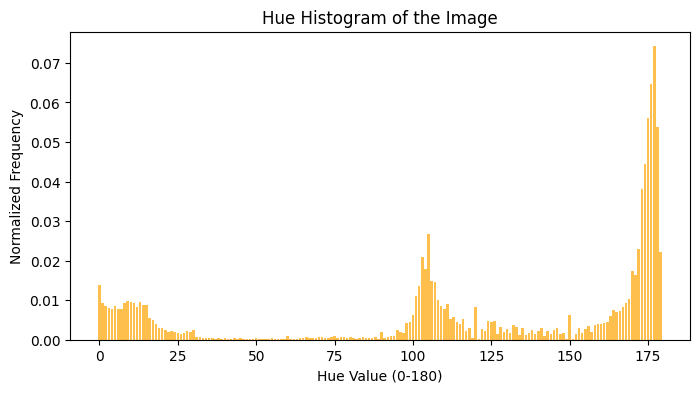

In [ ]:
import matplotlib.pyplot as plt

def plot_hue_histogram(image_path):
    """
    Extracts and plots the Hue histogram of a given image.
    """
    hue_hist = extract_hue_values(image_path)
    if hue_hist is None:
        print("Error: Could not extract Hue histogram.")
        return

    # Plot the histogram
    plt.figure(figsize=(8, 4))
    plt.bar(range(180), hue_hist, color='orange', alpha=0.7)
    plt.xlabel("Hue Value (0-180)")
    plt.ylabel("Normalized Frequency")
    plt.title("Hue Histogram of the Image")
    plt.show()

# Example Usage: Provide any image path from your dataset
sample_image_path = "/content/drive/MyDrive/Image_Templates_Lays/val/4_Wavy_BBQ/w9.JPG"
plot_hue_histogram(sample_image_path)

**Display the Histogram of just peak hue vlaues of image**

Peak Hue Values: [176]
Peak Frequencies: [0.0952]


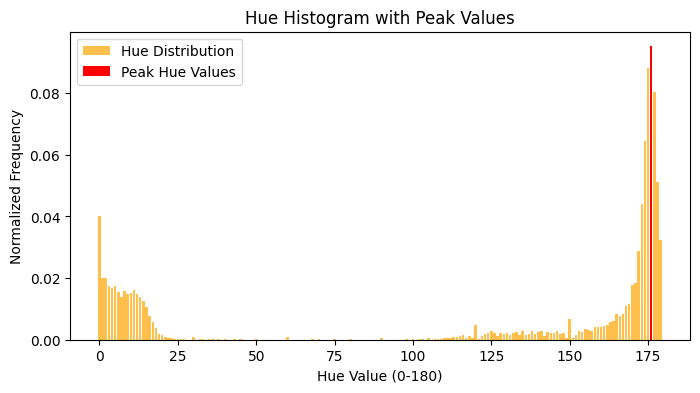

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_hue_histogram_peaks(image_path):
    """
    Extracts and plots only the peak values of the Hue histogram of a given image.
    """
    hue_hist = extract_hue_values(image_path)
    if hue_hist is None:
        print("Error: Could not extract Hue histogram.")
        return

    # Find the peak value(s) in the histogram
    peak_indices = np.where(hue_hist == np.max(hue_hist))[0]  # Indices of peak values
    peak_values = hue_hist[peak_indices]  # Corresponding peak values

    # Print peak Hue values and their frequencies
    print("Peak Hue Values:", peak_indices)
    print("Peak Frequencies:", peak_values)

    # Plot the histogram
    plt.figure(figsize=(8, 4))
    plt.bar(range(180), hue_hist, color='orange', alpha=0.7, label="Hue Distribution")

    # Highlight peak values in red
    plt.bar(peak_indices, peak_values, color='red', label="Peak Hue Values")

    plt.xlabel("Hue Value (0-180)")
    plt.ylabel("Normalized Frequency")
    plt.title("Hue Histogram with Peak Values")
    plt.legend()
    plt.show()

# Example Usage: Provide any image path from your dataset
sample_image_path = "/content/drive/MyDrive/Image_Templates_Lays/val/1_Masala/mm (9).JPG"
plot_hue_histogram_peaks(sample_image_path)